# Order-Agnostic Autoregressive Diffusion Models for Geostatistical Applications

## Introduction
Exploring for mineral or energy resources requires understanding the subsurface. 

The spatial distribution of these resources is critical to understanding how to efficiently extract critical resources, store energy, and potentially harmful greenhouse gases in subsurface reservoirs. 

Understanding these spatial distributions can help us to be more resource aware, economical, and safe in extraction or storage operations. 

Beyond understanding we may further wish to model the subsurface properties based on analogue examples, or conceptual models. 

Where data from direct observations such as boreholes or surface outcrops we may wish to include these to update our models so that they honor the available data. 

Due to the unknown nature of the precise spatial distribution of these properties away from the measurements we have to make assumptions about how these properties may vary in space (and sometimes time).

One possible way to do so, is to assume that the spatial distribution of subsurface properties is goverened by a random process, and so we build a statistical model which allows us to draw random samples, or models, of what the subsurface could look like. The field of geostatistics encompasses these and many more methods to perform statistical inference of spatial effects (not just subsurface material properties).

Here I will heavily make use of the work of others who have written and said much better than I could about a specific type of statistical model which has been a work horse of geostatistical applications and engineering in numerous geoscience domains. 



## Geostatistical Modeling

In geostatistical applications we often want to model the spatial distribution of properties such as the spatial distribution 
of the ore grade for a mineral resource or spatial distribution of porosities to store CO2 in the subsurface.

A common technique for generating spatial distributions of categorical (and with modification, continuous) properties
is so-called sequential indicator simulation (SIS).

[Gomez-Hernandez&Srivastasa](https://link.springer.com/article/10.1007/s11004-021-09926-0) provide an excellent review of 
sequential indicator simulation. 

In essence the idea, as they state, behind sequential indicator simulation is that any multidimensional random function can be 
represented as a product of univarite distributions by applying the rule of conditional probability:
$$F(Z(u_1), Z(u_2), ...., Z(u_n)) = F(Z(u_1)) F(Z(u_2)|Z(u_1)) ... F(Z(u_n)|Z(u_{n-1})Z(u_{n-2})...Z(u_2)Z(u_1))$$

Additionally, this sequence can be made conditional to existing data by determining the univariate probability distributions given the available data i.e. 
one essentially assumes you've already sampled a few of these values distributed in space and continues to generate a full realization from there.

In the case of SIS the probabilities for each indicator are obtained by kriging the probabilities at a new location $u_i$ being sampled 
and sampling from a the kriged probability univariate probability distribution conditional to all existing data and previously sampled locations.

The locations are sampled spatially in sequence by first generating a random path as a sequence for which we sample at every location
that we want to create a realization for.

The spatial distribution of the probabilities is obtained by experimental fitting of indicator variograms for each of the categories / indicator variables.

The sampling process is done step-by-step, grid-block by grid-block until we get a fully sampled realization that honors existing data.

This type of model, where we sequentially generate a realization variable-by-variable, step-by-step are often also called autoregressive models.



### Deep Generative Models
Generative modeling is the task of constructing or approximating data generating processes.
In a probabilistic sense we are attempting to build models of distributions of data. 

$$x\sim p(x)$$

In his upcoming book [Probabilistic Machine Learning: Advanced Topics](https://probml.github.io/pml-book/book2.html) [Kevin Patrick Murphy](Kevin Patrick Murphy)
has included an excellent chapter on so-called generative modeling. 

Numerous auto-regressive generative methods have been proposed, some of which use Deep Learning to learn the parameters of a generative model
from a large number of training images. 

The basic form that these autoregressive models take on is very similar to what we see in relation to SIS.
Taking from Murphy's book chapter 22 on autoregressive models, we can represent any multivariate probability distribution as a 
product of univariate conditional probabilities:

$$p(x_1, x_2, ..., x_{n-1}, x_{n})=p(x_1)p(x_2|x_1)...p(x_n|x_{n-1}, x_{n-2}, ..., x_2, x_1)$$

One such autoregressive model that uses deep learning to characterize this factorized conditional probability distribution 
are causal convolution models. These models learn to represent 1d, or 2d sequences over a multi-dimensional dataset such as 
audio (1d) or images (2d), by masking the convolutions to not take into account any variables that should not be involved in 
predicting the next variable in the sequence. 
![PixelCNN](https://www.codeproject.com/KB/books/5061271/image003.gif)

For example, we can sample a new tone in an audio file given only what has come before, and not what is after. To do so we must 
only take into account previous time-steps in our convolutions and requires masking any input data from later time steps.

An example of such a 1d causal convolutional model is the [wavenet]:
![wavenet](https://production-media.paperswithcode.com/methods/Screen_Shot_2020-05-24_at_12.11.35_AM_uO4kv1I.png)

Similarly we can conceive such causal convolutional models for images such as PixelCNN:
![PixelCNN](https://ai2-s2-public.s3.amazonaws.com/figures/2017-08-08/8e4ab54564fb492dcae9a1e862aedd3e52fb258b/2-Figure1-1.png)

As can be seen, an image is interpreted as a sequence of variables each representing a pixel in the image, and the convolutions of a neural 
network only take into account pixels that have already been sampled.

And here comes the problem with respect to geostatistical applications: If we want to use such a model we can very certainly 
learn unconditional models that do not honor any existing data. For any practical purposes though we want to include
existing measurements at spatially distributed locations. 

![from Srivastava 2013](https://www.researchgate.net/profile/Marko-Maucec/publication/273259554/figure/fig5/AS:294756795076615@1447286904834/Conditioning-data-for-simulation-of-sandstone-black-and-shale-white-in-a_Q320.jpg)  
(From Srivastava 2013, here the known data locations are shown as bold circles and unknonw in white)

If we wanted to include such data in the PixelCNN we'd have to 
create very elaborate or even (impossible?) masking schemes that would allow a convolutional network to take into account the spatial data
spread out over our study area. As of time of writing, I have not encountered such a model that is able to do this.

This is where I turn to a recent class of (deep) generative models called "Order-Agnostic" Autoregressive models which 
can potentially bridge this gap in application.

## Installing dependencies

In [1]:
!pip install lightning_bolts
!pip install wandb
!pip install torch-ema
!pip install diffusers
!pip install accelerate
!pip install huggingface_hub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 316 kB 14.5 MB/s 
     |████████████████████████████████| 585 kB 94.8 MB/s 
     |████████████████████████████████| 419 kB 96.3 MB/s 
     |████████████████████████████████| 596 kB 88.3 MB/s 
     |████████████████████████████████| 141 kB 101.0 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.8 MB 14.8 MB/s 
     |████████████████████████████████| 156 kB 71.7 MB/s 
     |████████████████████████████████| 181 kB 31.1 MB/s 
     |████████████████████████████████| 63 kB 2.2 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=faea28c52a2e73a53c1efc5ba73430b429024cec56

## Checking for Availability and Status of GPU

In [2]:
!nvidia-smi

Sat Jul 30 16:02:40 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Logging into Weights & Biases for Monitoring

In [3]:
!wandb login

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


## Import Libraries

In [4]:
%pylab inline
import imageio
import os
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions import Categorical, OneHotCategorical
from torch.utils.data import TensorDataset
from torchvision.datasets import MNIST
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, ToTensor, Lambda, Resize
from tqdm.notebook import tqdm
import wandb
from diffusers.models import UNet2DModel
from diffusers.optimization import get_cosine_schedule_with_warmup
from diffusers.training_utils import EMAModel
from accelerate import Accelerator, utils
import matplotlib.animation as animation
from IPython.display import HTML

Populating the interactive namespace from numpy and matplotlib


### Setting some (hyper-) parameters for the MNIST example

In [5]:
utils.set_seed(0)

batch_size = 128
w, h = 32, 32

transform = Compose([ToTensor(), Resize(w), lambda x: x>0.5])
train_dataset = MNIST(root=".", train=True, download=True, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True, drop_last=True)

test_dataset = MNIST(root=".", train=False, download=True, transform=transform)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, pin_memory=True, drop_last=True)

model = UNet2DModel(
    sample_size=w,
    in_channels=2,
    out_channels=2,
    layers_per_block=2,
    block_out_channels=(64, 64, 128, 128),
    down_block_types=(
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",
        "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D",
        "AttnUpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
)

model.load_state_dict(torch.load("./drive/MyDrive/oadg/mnist_step_4212.pth"))

accelerator = Accelerator(mixed_precision='fp16', log_with='wandb')
device = accelerator.device
model, train_dataloader, test_dataloader = accelerator.prepare(model, train_dataloader, test_dataloader)

model.eval()

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



UNet2DModel(
  (conv_in): Conv2d(2, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=64, out_features=256, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=256, out_features=256, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0): ResnetBlock(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=256, out_features=64, bias=True)
          (norm2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
        (1): ResnetBlock(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): Conv2d(

## Sampling a Random Path (batched)

In [6]:
def sample_random_path(batch_size, w, h, device='cuda'):
  random_path = torch.stack([torch.randperm(w*h, device=device, requires_grad=False) for _ in range(batch_size)], axis=0)
  return random_path

sampled_random_path = sample_random_path(batch_size, w, h, device=device)

## Visualize the (batched) random paths

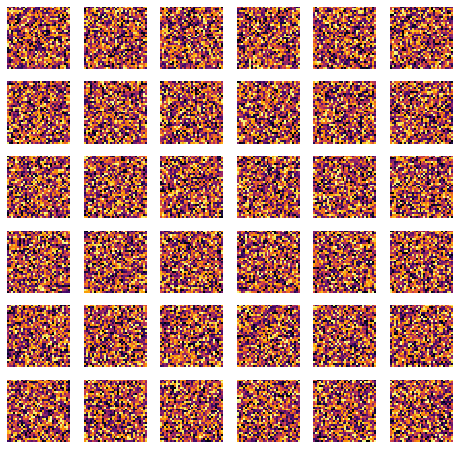

In [7]:
fig, ax = plt.subplots(6, 6, figsize=(8, 8))
for a, img in zip(ax.flatten(), sampled_random_path.cpu()):
  a.imshow(img.view(w, h), cmap="inferno", vmin=0, vmax=w*h, interpolation='none')
  a.set_axis_off()
plt.show()

### Create empty One-Hot Realization (0 - background, 1 - Foreground)

In [8]:
realization = torch.zeros(batch_size, 2, w, h, requires_grad=False, device=device).float()

## Create a linear index to step through random path

In [9]:
idx_range = torch.arange(start=0, end=w*h, step=1, device=device, requires_grad=False)

## Perform One Step of Sampling from the Model




In [10]:
idx = next(iter(idx_range))

### Create a mask with 1s where we've sampled already

In [11]:
def create_mask_at_random_path_index(sampled_random_path, idx):
  mask = (sampled_random_path < idx).view(batch_size, 1, w, h).long()
  return mask

mask = create_mask_at_random_path_index(sampled_random_path, idx)

### Visualize mask

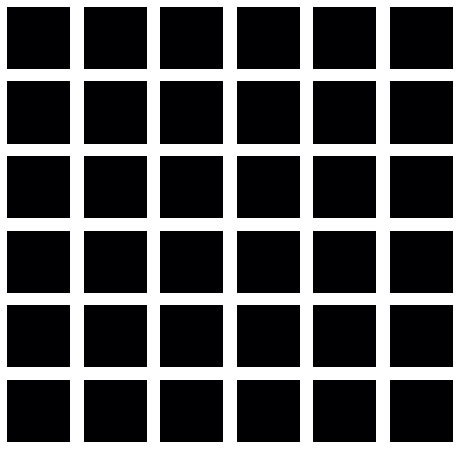

In [12]:
fig, ax = plt.subplots(6, 6, figsize=(8, 8))
for a, img in zip(ax.flatten(), mask.cpu()):
  a.imshow(img.view(w, h), cmap="inferno", vmin=0, vmax=1, interpolation='none')
  a.set_axis_off()
plt.show()

### Create a (batched) mask of where we are now sampling

In [13]:
def create_sampling_location_mask(sampled_random_path, idx, w, h):
  sampling_location_mask = (sampled_random_path == idx).view(-1, 1, w, h).long()
  return sampling_location_mask

sampling_location_mask = create_sampling_location_mask(sampled_random_path, idx, w, h)

### Visualize where we are now sampling

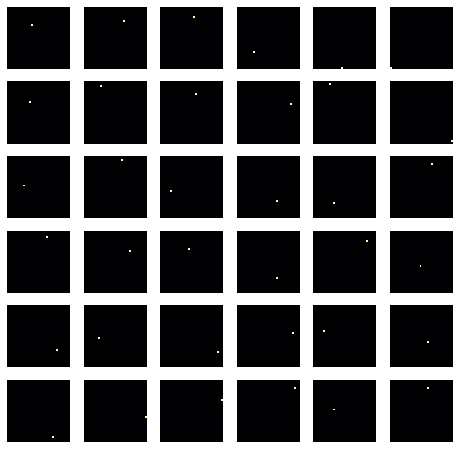

In [14]:
fig, ax = plt.subplots(6, 6, figsize=(8, 8))
for a, img in zip(ax.flatten(), sampling_location_mask.cpu()):
  a.imshow(img[0], cmap="inferno", vmin=0, vmax=1, interpolation='none')
  a.set_axis_off()
plt.show()

### Let's get the conditional distribution at these locations

In [15]:
def predict_conditional_prob(realization, model, sampling_location_mask, idx):
  logits = F.log_softmax(model(sampling_location_mask*realization, idx.view(-1,))['sample'], dim=1)
  conditional_prob = OneHotCategorical(logits=logits.permute(0, 2, 3, 1))
  return conditional_prob

with torch.inference_mode():
  conditional_prob = predict_conditional_prob(realization, model, sampling_location_mask, idx)

### We sample from this conditional probability distribution

In [16]:
def sample_from_conditional(conditional_prob):
  return conditional_prob.sample().permute(0, 3, 1, 2)

sampled_realization = sample_from_conditional(conditional_prob)

### Visualizing the resulting sample

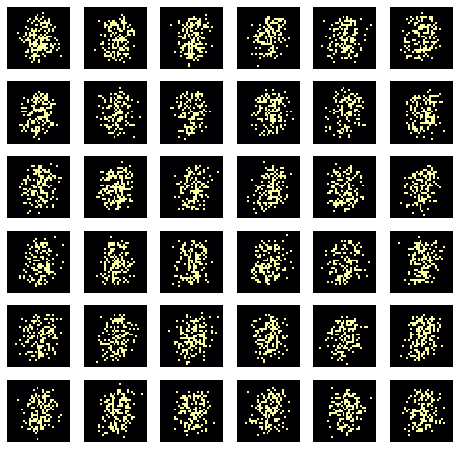

In [17]:
fig, ax = plt.subplots(6, 6, figsize=(8, 8))
for a, img in zip(ax.flatten(), torch.argmax(sampled_realization.cpu(), dim=1)):
  a.imshow(img, cmap="inferno", vmin=0, vmax=1, interpolation='none')
  a.set_axis_off()
plt.show()

### Combine realization with predicted value at current path location

In [18]:
def insert_predicted_value_at_sampling_location(realization, sampled_realization, sampling_location_mask):
  realization = (1-sampling_location_mask)*realization+sampling_location_mask*sampled_realization
  return realization

realization = insert_predicted_value_at_sampling_location(realization, sampled_realization, sampling_location_mask)

### Visualizing the updated realization

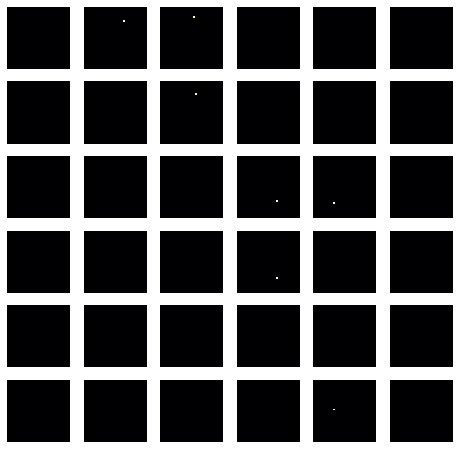

In [19]:
fig, ax = plt.subplots(6, 6, figsize=(8, 8))
for a, img in zip(ax.flatten(), torch.argmax(realization.cpu(), dim=1)):
  a.imshow(img, cmap="inferno", vmin=0, vmax=1, interpolation='none')
  a.set_axis_off()
plt.show()

### Computing the entropy of the conditional distribution

In [20]:
def compute_entropy(conditional_prob):
  return conditional_prob.entropy().unsqueeze(1)

conditional_entropy = compute_entropy(conditional_prob)

### Visualizing the entropy of the conditional distribution

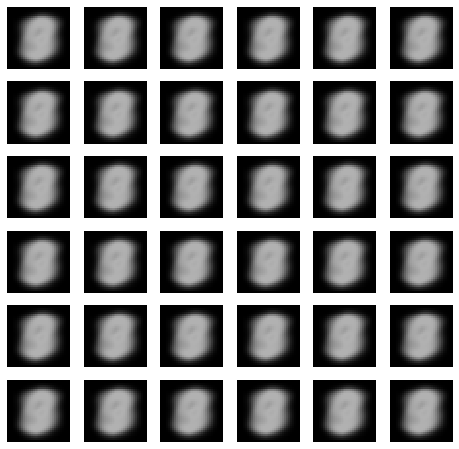

In [21]:
def binary_entropy(p, eps=1e-6):
  h = -p*np.log2(p+eps)-(1-p)*np.log2(1-p)
  
  if np.isnan(h):
    return eps
  return h

fig, ax = plt.subplots(6, 6, figsize=(8, 8))
for a, img in zip(ax.flatten(), conditional_entropy.cpu()):
  a.imshow(img[0], cmap="gray", vmin=binary_entropy(0), vmax=binary_entropy(0.5), interpolation='none')
  a.set_axis_off()
plt.show()

### Take the argmax of the one-hot realizaiton to get the realization

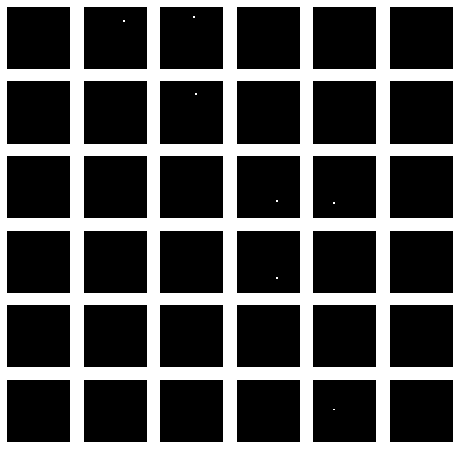

In [22]:
realization = torch.argmax(realization, dim=1, keepdim=True).cpu()

fig, ax = plt.subplots(6, 6, figsize=(8, 8))
for a, img in zip(ax.flatten(), realization.cpu()):
  a.imshow(img[0], cmap="gray", vmin=0, vmax=1, interpolation='none')
  a.set_axis_off()
plt.show()

## Putting it all together - Sampling a Realization

In [23]:
realizations = []
entropys = []

sampled_random_path = sample_random_path(batch_size, w, h, device=device)
realization = torch.zeros(batch_size, 2, w, h, requires_grad=False, device=device).float()
idx_range = torch.arange(start=0, end=w*h, step=1, device=device, requires_grad=False)

progress_bar = tqdm(idx_range, total=len(idx_range))
for idx in progress_bar:
  mask = create_mask_at_random_path_index(sampled_random_path, idx)

  sampling_location_mask = create_sampling_location_mask(sampled_random_path, idx, w, h)
  with torch.inference_mode():
    conditional_prob = predict_conditional_prob(realization, model, mask, idx)
  
  sampled_realization = sample_from_conditional(conditional_prob)
  realization = insert_predicted_value_at_sampling_location(realization, sampled_realization, sampling_location_mask)
  conditional_entropy = compute_entropy(conditional_prob)

  realizations.append(torch.argmax(realization, dim=1).cpu().numpy())
  entropys.append(conditional_entropy.cpu().numpy())

  progress_bar.set_description("Generating Sample. Step: {0:}".format(idx))

  0%|          | 0/1024 [00:00<?, ?it/s]

## Visualizing the generation of a batch of samples

In [23]:
def plot_grid():
  return 

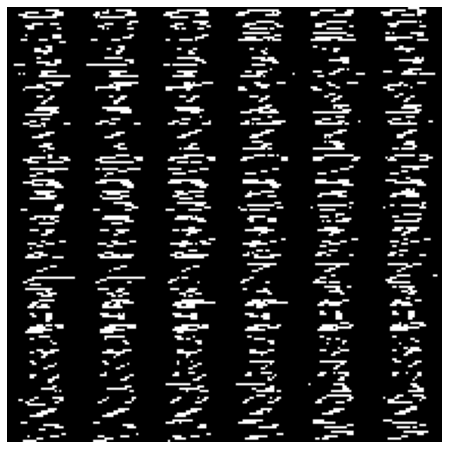

In [25]:
#%%capture
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
ims = [[plt.imshow(np.reshape(i[:36], (6*w, 6*h)), animated=True, cmap='gray', vmin=0, vmax=1)] for i in realizations[::100]]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Visualizing the change in entropy for a batch of samples during sampling

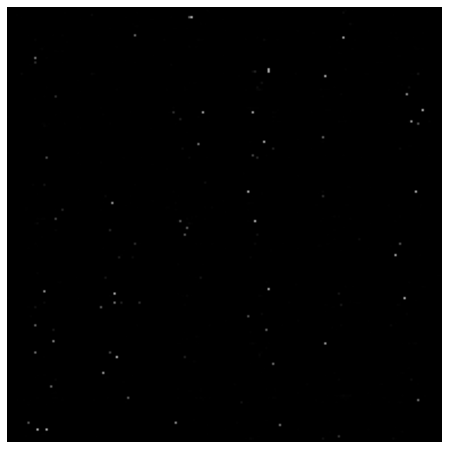

In [26]:
#%%capture
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
ims = [[plt.imshow(np.reshape(i[:36], (6*w, 6*h)), animated=True, cmap='gray', vmin=0, vmax=1)] for i in entropys[::100]]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Wrapping the sampling steps in a function

In [23]:
def sample(model, 
           w=64, h=64, 
           batch_size=36, 
           idx_range_start=0, 
           random_path=None, 
           realization=None, 
           device='cuda'):
  
  if random_path is None and realization is None:
    sampled_random_path = sample_random_path(batch_size, w, h, device=device)
    realization = torch.zeros(batch_size, 2, w, h, requires_grad=False, device=device).float()
  
  idx_range = torch.arange(start=idx_range_start, end=w*h, step=1, device=device, requires_grad=False)

  progress_bar = tqdm(idx_range, total=len(idx_range))
  for idx in progress_bar:
    mask = create_mask_at_random_path_index(sampled_random_path, idx)

    sampling_location_mask = create_sampling_location_mask(sampled_random_path, idx, w, h)
    with torch.inference_mode():
      conditional_prob = predict_conditional_prob(realization, model, mask, idx)
    
    sampled_realization = sample_from_conditional(conditional_prob)
    realization = insert_predicted_value_at_sampling_location(realization, sampled_realization, sampling_location_mask)
    conditional_entropy = compute_entropy(conditional_prob)

    progress_bar.set_description("Generating Sample. Step: {0:}".format(idx))

  realization = torch.argmax(realization, dim=1, keepdim=True).cpu()
  return realization

#realization = sample(model, batch_size=batch_size, h=h, w=w, device=device)

## Training the Order-Agnostic Autoregressive Model

## Defining a single gradient descent step

## Sample a batch of training images

In [27]:
realization, _ = next(iter(train_dataloader))
realization = realization.float()

### One-Hot the Realization

In [28]:
def one_hot_realization(realization):
  realization = torch.cat([1-realization, realization], dim=1)
  return realization

realization = one_hot_realization(realization)
print(realization.size())

torch.Size([128, 2, 32, 32])


### Sample a set of random paths

In [29]:
sampled_random_path = sample_random_path(batch_size, w, h, device=device)

### Sample random indices where we're gonna sample next

In [30]:
def sample_random_index_for_sampling(batch_size, w, h, device='cuda'):
  idx = torch.randint(low=0, high=w*h+1, size=(batch_size, 1, 1), device=device, requires_grad=False)
  return idx

idx = sample_random_index_for_sampling(batch_size, w, h, device=device)

### Create a mask from a random path

In [31]:
random_path_mask = create_mask_at_random_path_index(sampled_random_path.view(-1, w, h), idx)

### Compute the conditional probabilities

In [32]:
conditional_prob = predict_conditional_prob(realization, model, random_path_mask, idx)

### Compute log probability of the realization

In [33]:
def log_prob_of_realization(conditional_prob, realization):
  return conditional_prob._categorical.log_prob(torch.argmax(realization, dim=1))

log_prob = log_prob_of_realization(conditional_prob, realization)

### Compute log probability at unsampled locations

In [34]:
def log_prob_of_unsampled_locations(log_prob, sampling_location_mask):
  log_prob_unsampled = ((1-sampling_location_mask)*log_prob).sum(dim=(1, 2, 3))
  return log_prob_unsampled

log_prob_unsampled = log_prob_of_unsampled_locations(log_prob, sampling_location_mask)

### Compute reweighted loss

In [35]:
def weight_log_prob(log_prob_unsampled, w, h):
  log_prob_weighted = 1/(w*h-idx+1)*log_prob_unsampled
  return log_prob_weighted 

log_prob_weighted = weight_log_prob(log_prob_unsampled, w, h)


### Compute average loss over batch of realizations

In [36]:
def compute_average_loss_for_batch(log_prob_weighted):
  loss = -log_prob_weighted.mean()
  return loss

model.zero_grad()
loss = compute_average_loss_for_batch(log_prob_weighted)
print("Loss: {0:.3f}".format(loss.detach().item()))

Loss: 20.359


### Computing gradients of the loss with respect to model parameters

In [37]:
accelerator.backward(loss)
accelerator.clip_grad_norm_(model.parameters(), 100.0)

### Defining the ELBO objective

In [38]:
def elbo_objective(model, realization, device='cuda'):
  batch_size, _, w, h = realization.size()

  sampled_random_path = sample_random_path(batch_size, w, h, device=device)

  idx = sample_random_index_for_sampling(batch_size, w, h, device=device)
  
  random_path_mask = create_mask_at_random_path_index(sampled_random_path.view(-1, w, h), idx)
  
  conditional_prob = predict_conditional_prob(realization, model, random_path_mask, idx)

  log_prob = log_prob_of_realization(conditional_prob, realization)
  log_prob_unsampled = log_prob_of_unsampled_locations(log_prob, random_path_mask)
  log_prob_weighted = weight_log_prob(log_prob_unsampled, w, h)
  loss = compute_average_loss_for_batch(log_prob_weighted)

  return loss

### Putting all the steps together for a single forward and backward pass

In [37]:
model.zero_grad()
realization = next(iter(train_dataloader))[0].float()
realization = one_hot_realization(realization)
loss = elbo_objective(model, realization, device=device)
accelerator.backward(loss)
accelerator.clip_grad_norm_(model.parameters(), 100.0)
print("Loss: {0:.3f}".format(loss.detach().item()))

Loss: 13.312


### Defining a model, gradient descent optimizer, learning rate scheduler, and the exponential moving average operator

In [38]:
utils.set_seed(0)

model = UNet2DModel(
    sample_size=w,
    in_channels=2,
    out_channels=2,
    layers_per_block=2,
    block_out_channels=(64, 64, 128, 128),
    down_block_types=(
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",
        "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D",
        "AttnUpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
)

accelerator.init_trackers('autoregressive-models')

model.train()

optimizer = optim.AdamW(model.parameters(), 
                        lr=3e-4, 
                        weight_decay=1e-6)


lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=100,
    num_training_steps=(len(train_dataloader) * 1),
)

model, optimizer, train_dataloader, test_dataloader, lr_scheduler = accelerator.prepare(model, optimizer, train_dataloader, test_dataloader, lr_scheduler)

ema = EMAModel(model, inv_gamma=1.0, power=0.75, max_value=0.999)

wandb: Currently logged in as: lukas-mosser. Use `wandb login --relogin` to force relogin


## Train the Model for one epoch

In [42]:
global_step = 0
progress_bar = tqdm(enumerate(train_dataloader), total=len(train_dataloader))
for i, (realization, _) in progress_bar:
  realization = one_hot_realization(realization.float())

  optimizer.zero_grad()
  
  loss = elbo_objective(model, realization, device=device)
  accelerator.backward(loss)
  accelerator.clip_grad_norm_(model.parameters(), 100.0)

  global_step += 1
  lr_scheduler.step()
  optimizer.step()
  ema.step(model)

  logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0], "step": global_step}
  accelerator.log(logs, step=global_step)
  
  progress_bar.set_description("Step {0:}, Loss: {1:.2f}, Learning Rate: {2:.3e}".format(logs['step'], logs['loss'], logs['lr']))

  0%|          | 0/468 [00:00<?, ?it/s]

### Sample from the Exponential Moving Average Model

  0%|          | 0/1024 [00:00<?, ?it/s]

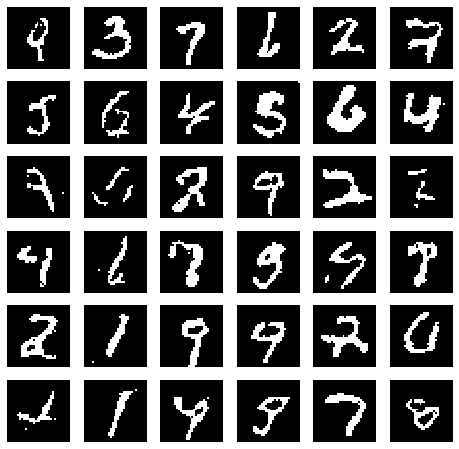

In [43]:
def sample_from_model(ema, accelerator, batch_size, w, h, device='cuda'):
  model = accelerator.unwrap_model(ema.averaged_model)
  model.eval()
  realization = sample(model, batch_size=batch_size, h=h, w=w, device=device)

  fig, ax = plt.subplots(6, 6, figsize=(8, 8))
  for a, img in zip(ax.flatten(), realization.cpu()):
    a.imshow(img[0], cmap="gray", vmin=0, vmax=1, interpolation='none')
    a.set_axis_off()
  plt.show()

  return realization

sampled_realization = sample_from_model(ema, accelerator, batch_size, h, w)

### Collecting all necessary steps and logging in a function

In [39]:
def train_autoregressive_diffusion_model(model, optimizer, lr_scheduler, train_dataloader, test_dataloader, accelerator, ema, epochs, path, fname, save_every, sample: bool = False):
  realizations = []
  global_step = 0
  for epoch in range(epochs):

    if epochs % save_every  == 0:
      model.eval()
      torch.save(accelerator.unwrap_model(ema.averaged_model).state_dict(), path+"/"+fname+"_step_{0:}.pth".format(global_step))
      if sample:
        realization = sample_from_model(ema, accelerator, batch_size, w, h, device='cuda')
        realizations.append(realization.cpu().numpy())
      model.train()
    
    progress_bar = tqdm(enumerate(train_dataloader), total=len(train_dataloader))
    for i, (realization, _) in progress_bar:
      realization = one_hot_realization(realization.float())
      
      optimizer.zero_grad()
      
      loss = elbo_objective(model, realization, device=device)
      accelerator.backward(loss)
      accelerator.clip_grad_norm_(model.parameters(), config.max_grad_norm)

      global_step += 1

      lr_scheduler.step()
      optimizer.step()
      ema.step(model)

      logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0], "step": global_step}
      accelerator.log(logs, step=global_step)
      
      progress_bar.set_description("Step {0:}, Loss: {1:.2f}, Learning Rate: {2:.3e}".format(logs['step'], logs['loss'], logs['lr']))

  return realizations

### Setting the hyper-parameters for final model training

In [40]:
from dataclasses import dataclass

@dataclass
class TrainingConfig:
    image_size = 32  # the generated image resolution
    train_batch_size = 128
    num_epochs = 10
    gradient_accumulation_steps = 1
    learning_rate = 3e-4
    lr_warmup_steps = 500
    weight_decay = 1e-6
    ema_inv_gamma = 1.0
    ema_power = 0.75
    ema_max_value = 0.999
    max_grad_norm = 100.0
    save_every = 10
    mixed_precision = 'fp16'  # `no` for float32, `fp16` for automatic mixed precision
    seed = 0

config = TrainingConfig()

### Inititalizing and training the final MNIST model

In [ ]:
config = TrainingConfig()

utils.set_seed(config.seed)

batch_size = config.train_batch_size
w, h = config.image_size, config.image_size

transform = Compose([ToTensor(), Resize(w), lambda x: x>0.5])
train_dataset = MNIST(root=".", train=True, download=True, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True, drop_last=True)

test_dataset = MNIST(root=".", train=False, download=True, transform=transform)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, pin_memory=True, drop_last=True)

model = UNet2DModel(
    sample_size=w,
    in_channels=2,
    out_channels=2,
    layers_per_block=2,
    block_out_channels=(64, 64, 128, 128),
    down_block_types=(
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",
        "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D",
        "AttnUpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
)

accelerator = Accelerator(mixed_precision=config.mixed_precision, log_with='wandb')
accelerator.init_trackers('order-agnostic-autoregressive-diffusion-mnist')
device = accelerator.device

optimizer = optim.AdamW(model.parameters(), 
                        lr=config.learning_rate, 
                        weight_decay=config.weight_decay)


lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=config.lr_warmup_steps,
    num_training_steps=(len(train_dataloader) * config.num_epochs),
)

model, optimizer, train_dataloader, test_dataloader, lr_scheduler = accelerator.prepare(model, optimizer, train_dataloader, test_dataloader, lr_scheduler)

ema = EMAModel(model, inv_gamma=config.ema_inv_gamma, power=config.ema_power, max_value=config.ema_max_value)

  0%|          | 0/1024 [00:00<?, ?it/s]

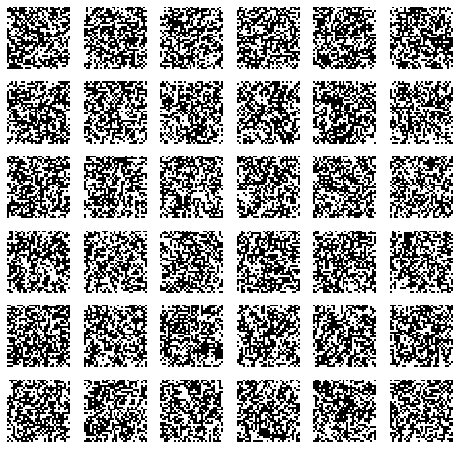

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

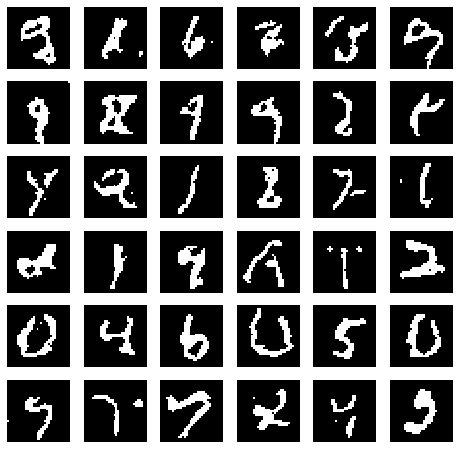

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

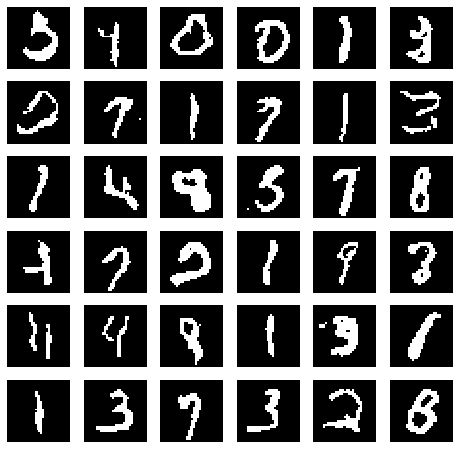

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

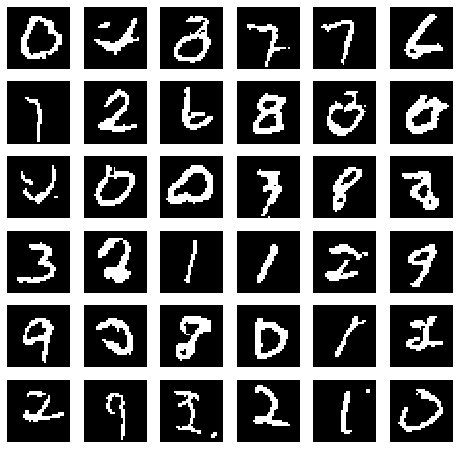

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

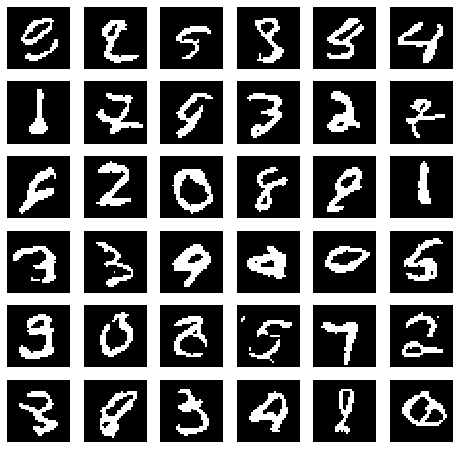

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

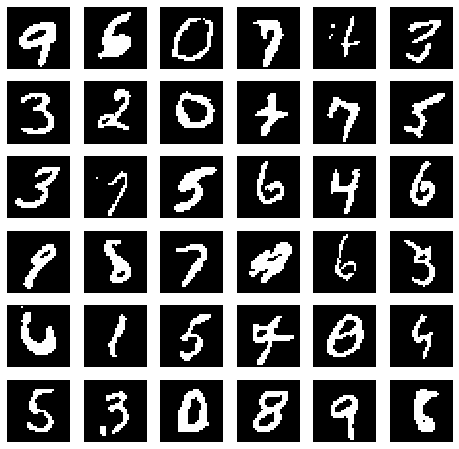

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

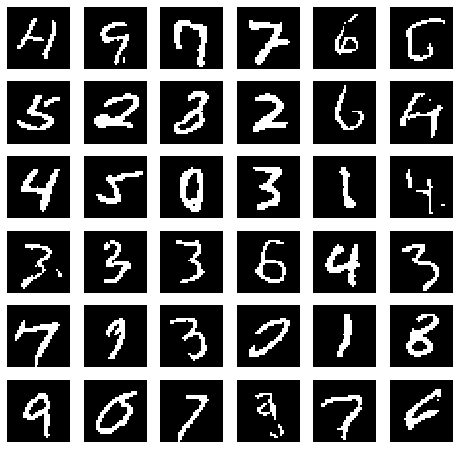

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

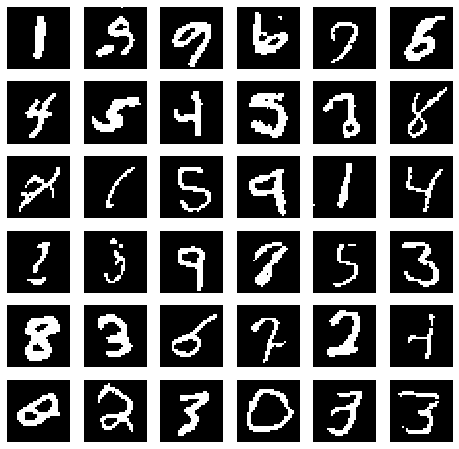

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

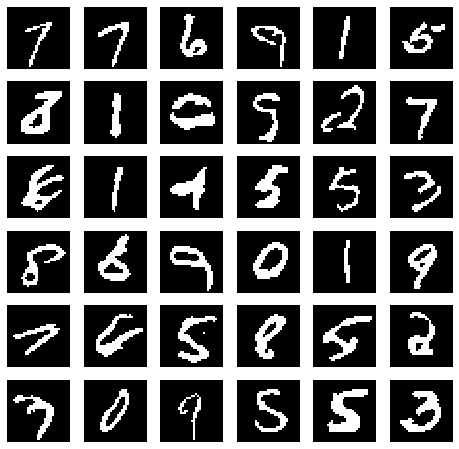

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

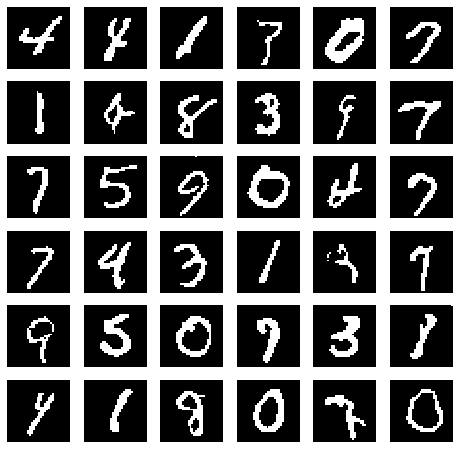

  0%|          | 0/468 [00:00<?, ?it/s]

In [ ]:
realizations = train_autoregressive_diffusion_model(model, optimizer, lr_scheduler, train_dataloader, test_dataloader, 
                                                    accelerator, ema, 
                                                    config.num_epochs, "./drive/MyDrive/oadg", "mnist", 
                                                    config.save_every, sample=True)

### Visualize the samples from each epoch

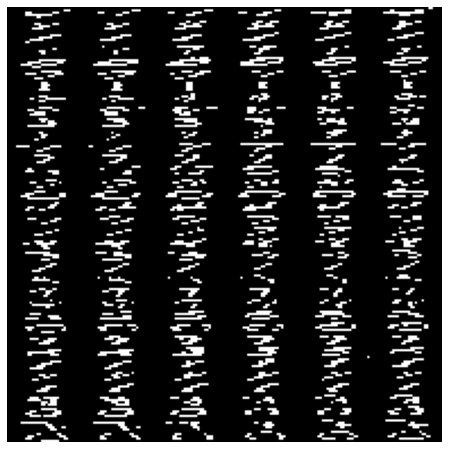

In [ ]:
#%%capture
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
ims = [[plt.imshow(np.reshape(i[:36], (6*w, 6*h)), animated=True, cmap='gray', vmin=0, vmax=1)] for i in realizations]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Sampling conditional realizations
### Setting some pixels to 1 (vertical line) as conditioning data

In [ ]:
conditioning_data = np.zeros((32, 32)).astype(int)
conditioning_data[16:16+1, 16:16+1] = 1

### Finding the indices of the conditioning data location

In [ ]:
flattened_img = conditioning_data.flatten()
conditioning_indices = np.argwhere(flattened_img>0)[:, 0]

### Creating random paths for a set of sampled conditioned realizations

In [ ]:
sigmas = []
for _ in range(batch_size):
  sigma_range = np.arange(w*h)
  np.random.shuffle(sigma_range)

  sigma_range[conditioning_indices] = np.arange(len(conditioning_indices))
  sigma_conditioned = sigma_range
  sigmas.append(sigma_conditioned)

sigmas = np.array(sigmas)

### Visualizing the conditioned random sampling paths

In [ ]:
fig, ax = plt.subplots(6, 6, figsize=(8, 8))
for a, img in zip(ax.flatten(), sigmas):
  a.imshow(img.reshape(32, 32), cmap="inferno", vmin=0, vmax=w*h, interpolation='none')
  a.set_axis_off()
plt.show()

### Initializing the conditioned realizations and sampling steps

In [ ]:
t_range_start = np.sum(flattened_img)
sigma_conditioned = torch.from_numpy(sigmas).to(device)

realization = torch.from_numpy(conditioning_data).view(1, 1, h, w).to(device)
realization = torch.cat([1-realization, realization], dim=1).float()

plt.imshow(realization.cpu()[0, 1])
plt.show()

### Sample from conditional data

In [ ]:
model.eval()

realizations = []
entropys = []

sampled_random_path = sigma_conditioned
idx_range = torch.arange(start=t_range_start, end=w*h, step=1, device=device, requires_grad=False)

progress_bar = tqdm(idx_range, total=len(idx_range))
for idx in progress_bar:
  mask = create_mask_at_random_path_index(sampled_random_path, idx)

  sampling_location_mask = create_sampling_location_mask(sampled_random_path, idx, w, h)

  with torch.inference_mode():
    conditional_prob = predict_conditional_prob(realization, model, mask, idx)
  
  sampled_realization = sample_from_conditional(conditional_prob)
  realization = insert_predicted_value_at_sampling_location(realization, sampled_realization, sampling_location_mask)
  conditional_entropy = compute_entropy(conditional_prob)

  realizations.append(torch.argmax(realization, dim=1).cpu().numpy())
  entropys.append(conditional_entropy.cpu().numpy())

  progress_bar.set_description("Generating Sample. Step: {0:}".format(idx))

  if idx % 50 == 0:
    plt.imshow(torch.argmax(realization, dim=1).cpu()[0])
    plt.show()

### Visualize Conditional Sample Generation

In [ ]:
fig, ax = plt.subplots(6, 6)
for a, img in zip(ax.flatten(), realizations[-1]):
  a.imshow(img.reshape(w, h))
  a.set_axis_off()
plt.show()

In [ ]:
fig = plt.figure(figsize=(6, 6))
plt.axis("off")
ims = [[plt.imshow(np.reshape(i[0], (w, h)), animated=True, cmap='gray', vmin=0, vmax=1)] for i in realizations]
ani = animation.ArtistAnimation(fig, ims, interval=10, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

### Visualize Conditional Sample Generation Entropy

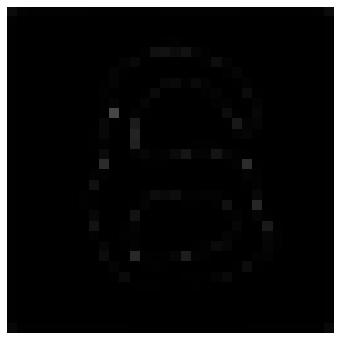

In [54]:
fig = plt.figure(figsize=(6, 6))
plt.axis("off")
ims = [[plt.imshow(np.reshape(i[0], (w, h)), animated=True, cmap='gray', vmin=0, vmax=1)] for i in entropys]
ani = animation.ArtistAnimation(fig, ims, interval=10, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

### Putting conditioning code in a function for later

In [55]:
def create_conditioned_realizations(model, conditioning_image, batch_size=36, plot_intermediate=False, figs=(6, 6), plot_interval=1000, device='cuda'):
  w, h = conditioning_image.shape
  D = h*w

  flattened_img = conditioning_image.flatten()
  conditioning_indices = np.argwhere(flattened_img>0)[:, 0]

  sigma_range = np.arange(D)
  np.random.shuffle(sigma_range)

  sigma_range[conditioning_indices] = np.arange(len(conditioning_indices))
  sigma_conditioned = sigma_range

  t_range_start = np.sum(flattened_img)
  sigma_conditioned = torch.from_numpy(sigma_conditioned).unsqueeze(0).repeat(batch_size, 1).to(device)

  X = torch.from_numpy(conditioning_image).view(1, 1, h, w).to(device)
  X = torch.cat([1-X, X], dim=1).float()

  conditioned_samples = sample(model, w=w, h=h, batch_size=batch_size, t_range_start=t_range_start, sigma=sigma_conditioned, plot_intermediate=plot_intermediate, X=X, figs=figs, plot_interval=plot_interval, device=device)
  return conditioned_samples


conditioned_samples_mnist = create_conditioned_realizations(accelerator.unwrap_model(ema.averaged_model), conditioning_data, batch_size=36, plot_intermediate=True, figs=(6, 6), device=device, plot_interval=50)


TypeError: ignored

## Training the order-agnostic autoregressive diffusion model on a training image of a river channel system

In [41]:
!wget https://raw.githubusercontent.com/elaloy/gan_for_gradient_based_inv/master/training/ti/ti.png

--2022-07-30 16:04:45--  https://raw.githubusercontent.com/elaloy/gan_for_gradient_based_inv/master/training/ti/ti.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 144022 (141K) [image/png]
Saving to: ‘ti.png’

ti.png              100%[===================>] 140.65K  --.-KB/s    in 0.008s  

2022-07-30 16:04:45 (17.7 MB/s) - ‘ti.png’ saved [144022/144022]



### Let's visualize the training image

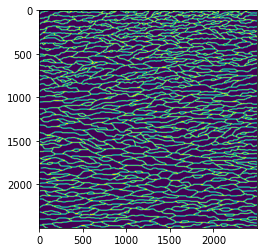

In [42]:
ti = imageio.imread('ti.png')

plt.imshow(ti)
plt.show()

### Extracting training sub-patches from a large training image

In [43]:
def extract_patches(img, patch_size=64, stride=16, flip_up_down=False, flip_left_right=False, mirror=False):
  patches = []
  for i in range(0, img.shape[0]-patch_size, 16):
    for j in range(0, img.shape[1]-patch_size, 16):
      patches.append(img[i:i+patch_size, j:j+patch_size])
  patches = np.array(patches)
  all_patches = [patches]
  if flip_up_down:
    all_patches.append(patches[..., ::-1, :])
  if flip_left_right:
    all_patches.append(patches[..., :, ::-1])
  if mirror:
    all_patches.append(patches[..., ::-1, ::-1])
  patches = np.concatenate(all_patches, axis=0)
  return patches

patch_size = (64, 64)
stride = 16

train_patches = extract_patches(ti, patch_size=patch_size[0], stride=stride, flip_up_down=True, mirror=True, flip_left_right=True)

train_patches = torch.from_numpy(train_patches).unsqueeze(1)

train_dataset = TensorDataset(train_patches/255., torch.zeros(train_patches.size(0), 1))

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True, drop_last=True)


### Let's visualize a batch of training images

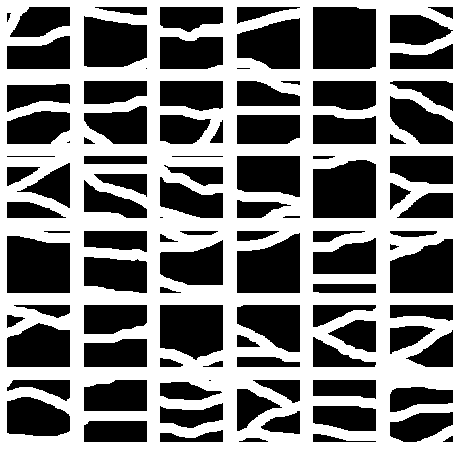

In [44]:
images, _ = next(iter(train_dataloader))

fig, ax = plt.subplots(6, 6, figsize=(8, 8))
for a, img in zip(ax.flatten(), images.cpu()):
  a.imshow(img[0], cmap="gray", vmin=0, vmax=1, interpolation='none')
  a.set_axis_off()
plt.show()

## Setting the Hyper-Parameters

In [45]:
from dataclasses import dataclass

@dataclass
class TrainingConfig:
    image_size = 64  # the generated image resolution
    train_batch_size = 64
    num_epochs = 10
    gradient_accumulation_steps = 1
    learning_rate = 3e-4
    lr_warmup_steps = 500
    weight_decay = 1e-6
    ema_inv_gamma = 1.0
    ema_power = 0.75
    ema_max_value = 0.999
    max_grad_norm = 100.0
    save_every = 10
    mixed_precision = 'fp16'  # `no` for float32, `fp16` for automatic mixed precision
    seed = 0

config = TrainingConfig()

### Inititalizing the Model, Optimizer, and Scheduler

In [46]:
config = TrainingConfig()

utils.set_seed(config.seed)

batch_size = config.train_batch_size
w, h = config.image_size, config.image_size

transform = Compose([ToTensor(), Resize(w), lambda x: x>0.5])
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True, drop_last=True)

model = UNet2DModel(
    sample_size=w,
    in_channels=2,
    out_channels=2,
    layers_per_block=2,
    block_out_channels=(64, 64, 128, 128),
    down_block_types=(
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",
        "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D",
        "AttnUpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
)

accelerator = Accelerator(mixed_precision=config.mixed_precision, log_with='wandb')
accelerator.init_trackers('order-agnostic-autoregressive-diffusion-channels')
device = accelerator.device

optimizer = optim.AdamW(model.parameters(), 
                        lr=config.learning_rate, 
                        weight_decay=config.weight_decay)

lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=config.lr_warmup_steps,
    num_training_steps=(len(train_dataloader) * config.num_epochs),
)

model, optimizer, train_dataloader, test_dataloader, lr_scheduler = accelerator.prepare(model, optimizer, train_dataloader, test_dataloader, lr_scheduler)

ema = EMAModel(model, inv_gamma=config.ema_inv_gamma, power=config.ema_power, max_value=config.ema_max_value)

wandb: Currently logged in as: lukas-mosser. Use `wandb login --relogin` to force relogin


In [ ]:
realizations = train_autoregressive_diffusion_model(model, optimizer, lr_scheduler, 
                                                    train_dataloader, test_dataloader, accelerator, ema, 
                                                    config.num_epochs, "./drive/MyDrive/oadg", "channels",
                                                    config.save_every, sample=False)

  0%|          | 0/1463 [00:00<?, ?it/s]

In [48]:
model.load_state_dict(torch.load("./drive/MyDrive/oadg/channels_step_13167.pth"))

<All keys matched successfully>

In [49]:
conditioning_data = np.zeros((64, 64)).astype(int)
conditioning_data[10, 10] = 1
conditioning_data[10, 45] = 0
conditioning_data[45, 45] = 1
conditioning_data[45, 10] = 0

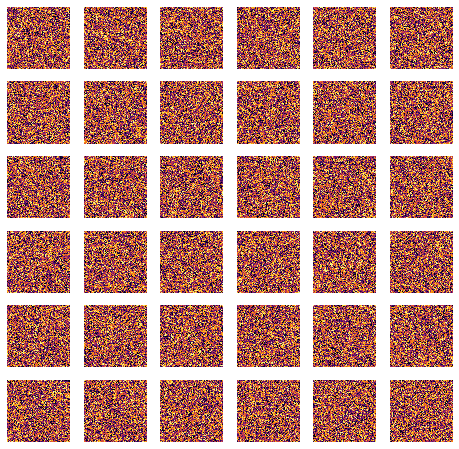

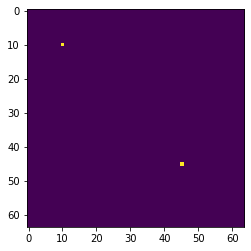

  0%|          | 0/4094 [00:00<?, ?it/s]

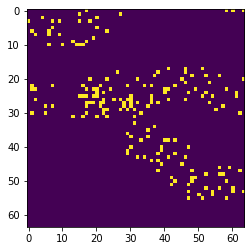

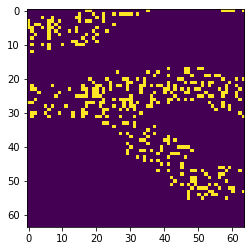

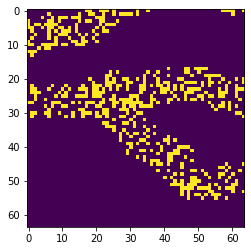

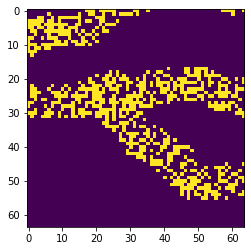

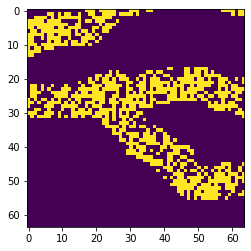

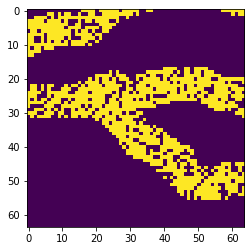

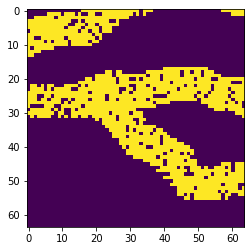

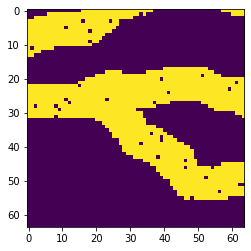

In [50]:
flattened_img = conditioning_data.flatten()
conditioning_indices = np.argwhere(flattened_img>0)[:, 0]

sigmas = []
for _ in range(batch_size):
  sigma_range = np.arange(w*h)
  np.random.shuffle(sigma_range)

  sigma_range[conditioning_indices] = np.arange(len(conditioning_indices))
  sigma_conditioned = sigma_range
  sigmas.append(sigma_conditioned)

sigmas = np.array(sigmas)

fig, ax = plt.subplots(6, 6, figsize=(8, 8))
for a, img in zip(ax.flatten(), sigmas):
  a.imshow(img.reshape(w, h), cmap="inferno", vmin=0, vmax=w*h, interpolation='none')
  a.set_axis_off()
plt.show()

t_range_start = np.sum(flattened_img)
sigma_conditioned = torch.from_numpy(sigmas).to(device)

realization = torch.from_numpy(conditioning_data).view(1, 1, h, w).to(device)
realization = torch.cat([1-realization, realization], dim=1).float()

plt.imshow(realization.cpu()[0, 1])
plt.show()
model.eval()

realizations = []
entropys = []

sampled_random_path = sigma_conditioned
idx_range = torch.arange(start=t_range_start, end=w*h, step=1, device=device, requires_grad=False)

progress_bar = tqdm(idx_range, total=len(idx_range))
for idx in progress_bar:
  mask = create_mask_at_random_path_index(sampled_random_path, idx)

  sampling_location_mask = create_sampling_location_mask(sampled_random_path, idx, w, h)

  with torch.inference_mode():
    conditional_prob = predict_conditional_prob(realization, model, mask, idx)
  
  sampled_realization = sample_from_conditional(conditional_prob)
  realization = insert_predicted_value_at_sampling_location(realization, sampled_realization, sampling_location_mask)
  conditional_entropy = compute_entropy(conditional_prob)

  realizations.append(torch.argmax(realization, dim=1).cpu().numpy())
  entropys.append(conditional_entropy.cpu().numpy())

  progress_bar.set_description("Generating Sample. Step: {0:}".format(idx))

  if idx % 500 == 0:
    plt.imshow(torch.argmax(realization, dim=1).cpu()[0])
    plt.show()

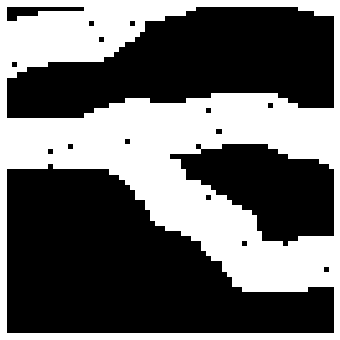

In [51]:
fig = plt.figure(figsize=(6, 6))
plt.axis("off")
ims = [[plt.imshow(np.reshape(i[0], (w, h)), animated=True, cmap='gray', vmin=0, vmax=1)] for i in realizations[::50]]
ani = animation.ArtistAnimation(fig, ims, interval=10, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

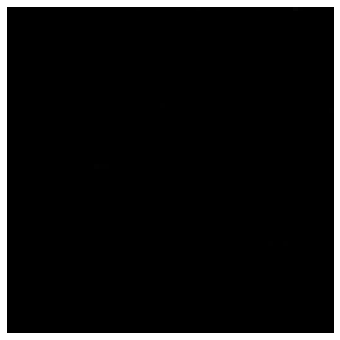

In [53]:
fig = plt.figure(figsize=(6, 6))
plt.axis("off")
ims = [[plt.imshow(np.reshape(i[0], (w, h)), animated=True, cmap='gray', vmin=0, vmax=1)] for i in entropys[::20]]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())